# Forward process test

In [ ]:
# Importing packages
import os, math, glob, random, sys, importlib
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt

# Mounting on the Drive

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# Importing project packages
PROJ = "/content/drive/MyDrive/HANDS_ON_GEN_AI" # function folder
IMAGE_DIR = os.path.join(PROJ, "Datasets/COCO/val2017")# image folder

# Making packages importable
sys.path.append(PROJ)
importlib.invalidate_caches()

from Configurations import ForwardConfig
from subVP_SDE import subVP_SDE
from subVP_processes import DiffusionProcesses as _FP

In [ ]:
# importlib.reload(ForwardConfig)
# importlib.reload(subVP_SDE)
# importlib.reload(ForwardProcess)

In [ ]:
# Setting testing parameters
MAX_IMAGES = 32 # number of images
RESIZE = 256 #re-sizing dimension
USE_FORWARDPROCESS_IF_AVAILABLE = True
T_LIST = None # None will use [0.1, 0.5, 0.9, t_used], where t_used is present ForwardConfig.t and when ForwardCondif.final = True

In [ ]:
# Creating an instance of ForwardProcess
ForwardProcess = _FP

# Helper Function

In [ ]:
# We define some helper functions
# 1) Define a list_images, truncating at MAX_IMAGES
# 2) Load the images, convert them to RGB, normalize them and stack them into a Tensor
# 3) Prepare the image to be shown by converting the type
# 4) Use the previous function to present the first n examples and returning an image

def list_images(folder, max_items: int = 10):
    exts = ("*.jpg","*.jpeg","*.png","*.bmp","*.webp")
    paths = []
    for ext in exts:
        paths.extend(glob.glob(os.path.join(folder, ext)))
    paths = sorted(paths)
    paths = paths[:max_items]
    return paths

def load_images(paths, resize=256, normalize_to_minus1_1=True, device="cpu"):
    imgs = []
    for p in paths:
        im = Image.open(p).convert("RGB")
        if resize is not None:
            im = im.resize((resize, resize), Image.BICUBIC)
        arr = np.asarray(im).astype(np.float32) / 255.0
        arr = np.transpose(arr, (2,0,1))
        x = torch.from_numpy(arr)
        if normalize_to_minus1_1:
            x = x * 2.0 - 1.0
        imgs.append(x)
    batch = torch.stack(imgs, dim=0).to(device)
    return batch

def to_numpy_image(x):
    x = x.detach().float().cpu()
    x = (x + 1.0) * 0.5
    x = x.clamp(0,1)
    x = (x.permute(1,2,0).numpy() * 255.0).astype(np.uint8)
    return x

def show_examples(x0, xt, t_value, n=4, title_prefix="t"):
    n = min(n, x0.size(0))
    idxs = list(range(n))
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(6, 3*n))
    for r,i in enumerate(idxs):
        orig = to_numpy_image(x0[i])
        noised = to_numpy_image(xt[i])
        if n == 1:
            ax0, ax1 = axes[0], axes[1]
        else:
            ax0, ax1 = axes[r,0], axes[r,1]
        ax0.imshow(orig);  ax0.set_title("original"); ax0.axis("off")
        ax1.imshow(noised); ax1.set_title(f"noised @ {title_prefix}={t_value:.3f}"); ax1.axis("off")
    plt.tight_layout()
    plt.show()

# Load configuration and data

In [ ]:
# Load config and data
cfg = ForwardConfig()
device = "cuda" if torch.cuda.is_available() else "cpu"
paths = list_images(IMAGE_DIR, max_items=MAX_IMAGES)
x0 = load_images(paths, resize=RESIZE, normalize_to_minus1_1=True, device=device)

def resolve_t_list_from_cfg(c: ForwardConfig):
  """Prepare the timepoint to test
  Specifically it takes the configuartion from ForwardConfig: t, final, eps
  If final = True, we want the final step of the process but not exactly t=1, but t=1-eps
  We keep every value slighly above 0 and slighly below 1 while avoiding duplicates with the set()"""

  t_used = (1.0 - float(c.eps)) if c.final else float(c.t)
  tl = [0.1, 0.5, 0.9, t_used]
  # keep unique and sort within (0, 1)
  tl = sorted(set([min(max(1e-5, float(t)), 1.0 - 1e-6) for t in tl]))
  return tl

if T_LIST is None:
    T_LIST = resolve_t_list_from_cfg(cfg)

# Build the SDE with specific cfg betas
sde = subVP_SDE(beta_min=cfg.beta_min, beta_max=cfg.beta_max, N=cfg.N)

# Print out specifics
print(f"Device: {device}")
print(f"Batch: {tuple(x0.shape)}  dtype={x0.dtype}")
print(f"β₀={cfg.beta_min}  β₁={cfg.beta_max}  N={cfg.N}")
print(f"Testing t in {T_LIST}\n")

Device: cpu
Batch: (32, 3, 256, 256)  dtype=torch.float32
β₀=0.1  β₁=20.0  N=1000
Testing t in [0.1, 0.5, 0.9, 0.99999]



# Execute image noising

## Closed form perturbation

[t=0.100]  eps_mean=-0.0001  eps_std=0.9999  σ_pred(mean)=0.3221  |σ_emp-σ_pred|_MAE=0.0004  σ_emp/σ_pred≈1.000  recon_err(max)=4.77e-07  MSE(xt,x0)=0.1046


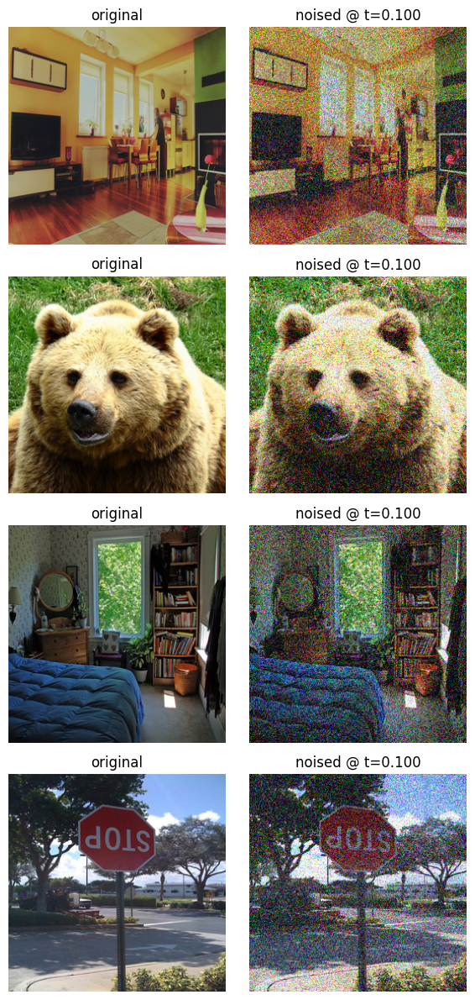

  ForwardProcess check Absolute values: Δxt=9.454e-01  Δeps=1.129e+00  Δσ=6.779e-01
  ForwardProcess check Not-Absolute values: Δxt=1.214e-01  Δeps=3.032e-04  Δσ=6.779e-01
[t=0.500]  eps_mean=+0.0003  eps_std=0.9997  σ_pred(mean)=0.9597  |σ_emp-σ_pred|_MAE=0.0012  σ_emp/σ_pred≈1.000  recon_err(max)=4.77e-07  MSE(xt,x0)=1.0914


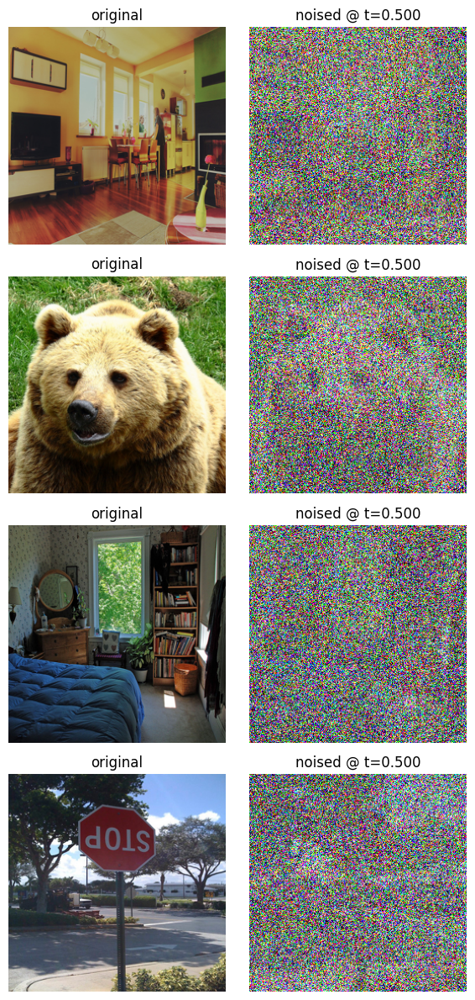

  ForwardProcess check Absolute values: Δxt=1.113e+00  Δeps=1.128e+00  Δσ=4.032e-02
  ForwardProcess check Not-Absolute values: Δxt=3.499e-02  Δeps=-4.240e-04  Δσ=4.032e-02
[t=0.900]  eps_mean=+0.0004  eps_std=0.9999  σ_pred(mean)=0.9999  |σ_emp-σ_pred|_MAE=0.0012  σ_emp/σ_pred≈1.000  recon_err(max)=4.77e-07  MSE(xt,x0)=1.3189


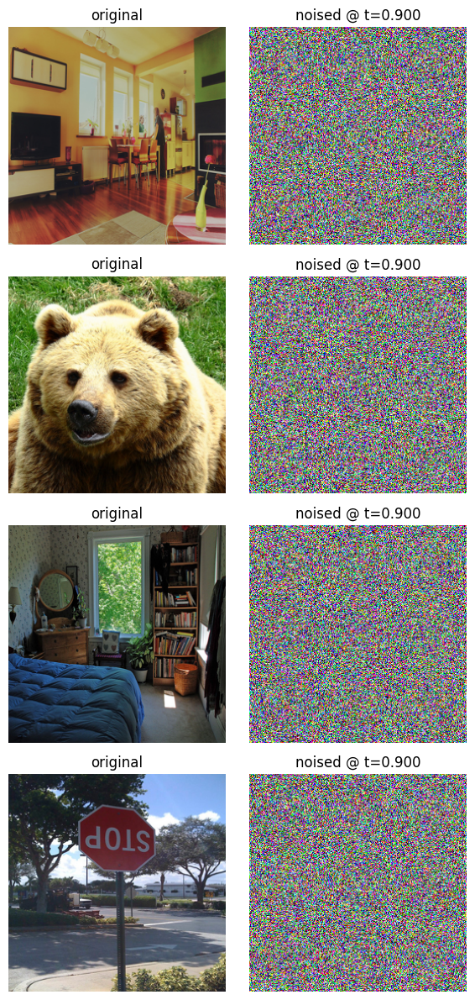

  ForwardProcess check Absolute values: Δxt=1.128e+00  Δeps=1.128e+00  Δσ=1.228e-04
  ForwardProcess check Not-Absolute values: Δxt=1.187e-03  Δeps=-1.567e-04  Δσ=1.228e-04
[t=1.000]  eps_mean=-0.0002  eps_std=1.0004  σ_pred(mean)=1.0000  |σ_emp-σ_pred|_MAE=0.0012  σ_emp/σ_pred≈1.000  recon_err(max)=2.38e-07  MSE(xt,x0)=1.3267


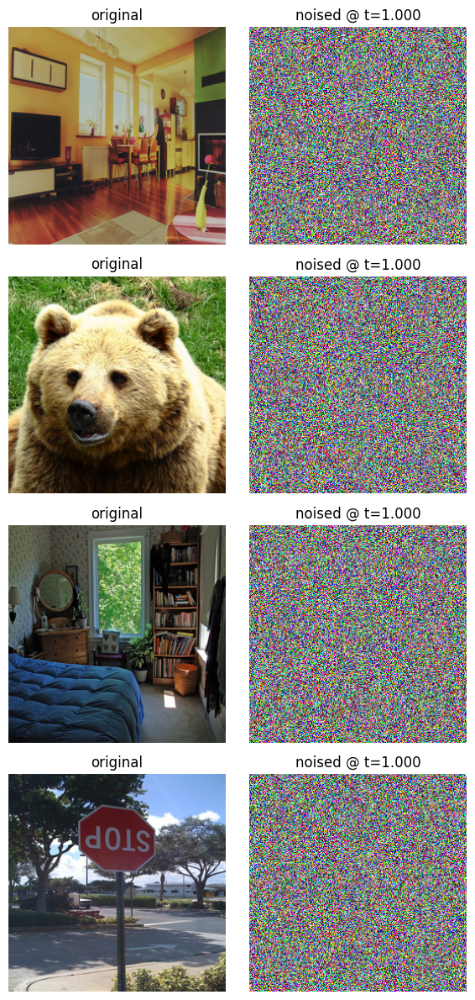

  ForwardProcess check Absolute values: Δxt=1.129e+00  Δeps=1.129e+00  Δσ=0.000e+00
  ForwardProcess check Not-Absolute values: Δxt=4.824e-04  Δeps=4.824e-04  Δσ=0.000e+00

Done.


In [ ]:
# Run corruption and diagnostics
torch.manual_seed(cfg.seed)
for t_val in T_LIST:
    with torch.no_grad():
        t_vec = torch.full((x0.size(0),), float(t_val), device=x0.device, dtype=x0.dtype) # We build a length-B vector so that we can bradcast per sample

        # Closed-form corruption using your SDE
        xt, eps_used, std_pred = sde.perturb_closed(x0, t_vec) # returns (B,C,H,W), (B,C,H,W), (B,)
        mean_t, std_again = sde.marginal_prob(x0, t_vec) # mean_t (B,1,1,1), std_again (B,)

        # Reconstruct epsilon from xt and compare to returned eps
        eps_recon = (xt - mean_t) / (std_again[:, None, None, None] + 1e-12)
        recon_err = (eps_recon - eps_used).abs().max().item() # Max absolute difference should be ~ 0

        # Distribution sanity of epsilon
        eps_mean = eps_used.mean().item()
        eps_std  = eps_used.std().item()

        # Empirical std of (xt - mean_t) should match σ(t)
        empirical_std = (xt - mean_t).flatten(1).std(dim=1) # computed per-sample
        mae_sigma = torch.mean(torch.abs(empirical_std - std_again)).item() # MAE between empirical and predicted
        ratio_sigma = torch.mean(empirical_std / (std_again + 1e-12)).item() # Scale ratio should be ~ 1, because it capture bias of sigma(t)

        # Magnitude of corruption vs x0
        mse_x = F.mse_loss(xt, x0).item()

        print(f"[t={t_val:.3f}]  eps_mean={eps_mean:+.4f}  eps_std={eps_std:.4f}  "
              f"σ_pred(mean)={std_again.mean().item():.4f}  "
              f"|σ_emp-σ_pred|_MAE={mae_sigma:.4f}  σ_emp/σ_pred≈{ratio_sigma:.3f}  "
              f"recon_err(max)={recon_err:.2e}  MSE(xt,x0)={mse_x:.4f}")

        # Show a few examples
        show_examples(x0, xt, t_val, n=4, title_prefix="t")

# 6) Optional cross-check with ForwardProcess if available and callable
    if ForwardProcess is not None:
        try:
            # Build a matching sde_cfg container from cfg
            sde_cfg = ForwardProcess(beta_min=cfg.beta_min, beta_max=cfg.beta_max, N=cfg.N)
            # Try to call its API name if present
            got = getattr(ForwardProcess, "get_noised_latents", None)
            if callable(got):
                with torch.no_grad():
                    xt2, eps2, std2 = got(z0=x0, t=float(t_val), final=cfg.final,
                                          eps=cfg.eps, closed_formula=cfg.closed_formula, steps=cfg.N,
                                          seed=cfg.seed, sde_cfg=sde_cfg)
                #We are expecting a d_std that is close to 0, and a d_xt and d_eps which are >0, because of the independent sampling of epsilon
                d_xt = (xt2 - xt).abs().mean().item()
                d_eps = (eps2 - eps_used).abs().mean().item()
                d_std = (std2 - std_again).abs().mean().item()

                #We are expecting all metrics to be close to 0, since now we are taking in account sign difference
                d_xt_tot = (xt2 - xt).mean().item()
                d_eps_tot = (eps2 - eps_used).mean().item()
                d_std_tot = (std2 - std_again).mean().item()
                print(f"  ForwardProcess check Absolute values: Δxt={d_xt:.3e}  Δeps={d_eps:.3e}  Δσ={d_std:.3e}")
                print(f"  ForwardProcess check Not-Absolute values: Δxt={d_xt_tot:.3e}  Δeps={d_eps_tot:.3e}  Δσ={d_std_tot:.3e}")
            else:
                print("  ForwardProcess.get_noised_latents not found; skipped.")
        except Exception as e:
            print(f"  ForwardProcess cross-check failed: {type(e).__name__}: {e}")

print("\nDone.")

## Euler - Maruyama formula

[t=0.100]  eps_mean=-0.0000  eps_std=0.3218  σ_pred(mean)=0.3221  |σ_emp-σ_pred|_MAE=0.2184  σ_emp/σ_pred≈0.322  recon_err(max)=0.00e+00  MSE(xt,x0)=0.0117


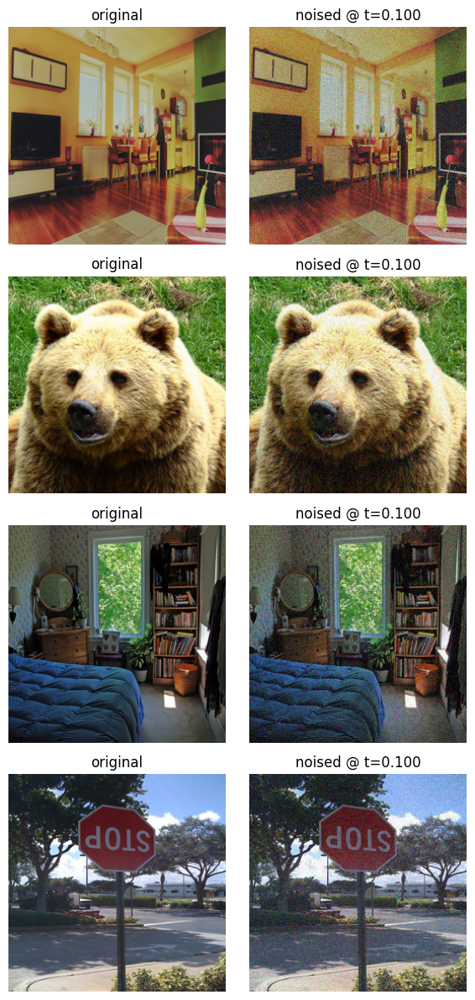

  ForwardProcess check Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
  ForwardProcess check Not-Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
[t=0.500]  eps_mean=-0.0001  eps_std=0.9603  σ_pred(mean)=0.9597  |σ_emp-σ_pred|_MAE=0.0381  σ_emp/σ_pred≈0.960  recon_err(max)=0.00e+00  MSE(xt,x0)=1.0205


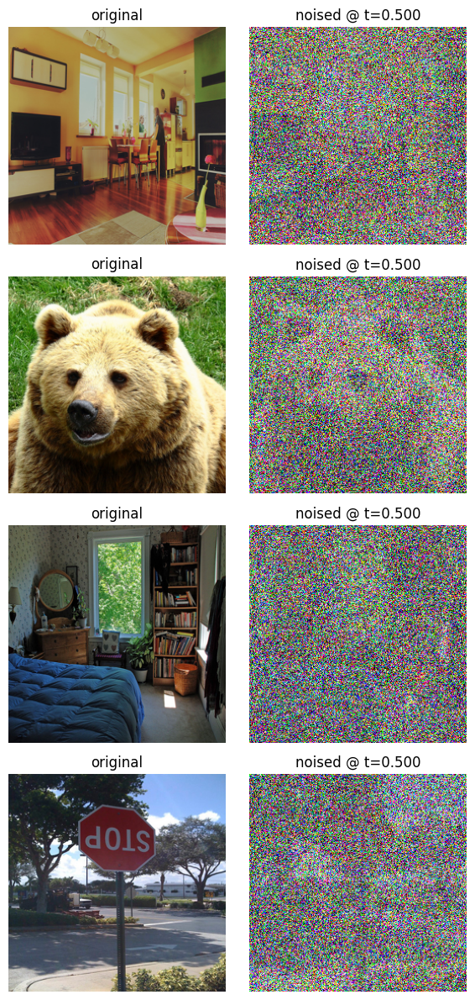

  ForwardProcess check Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
  ForwardProcess check Not-Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
[t=0.900]  eps_mean=-0.0002  eps_std=1.0020  σ_pred(mean)=0.9999  |σ_emp-σ_pred|_MAE=0.0022  σ_emp/σ_pred≈1.002  recon_err(max)=0.00e+00  MSE(xt,x0)=1.3237


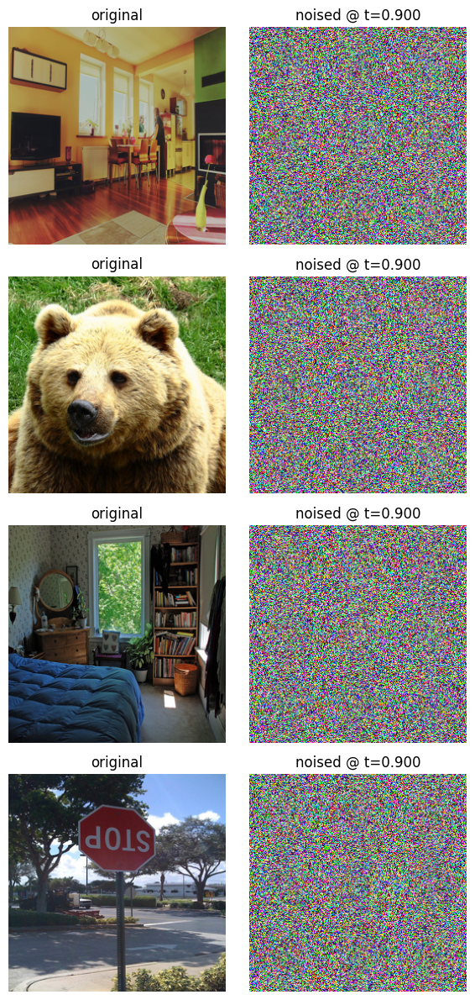

  ForwardProcess check Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
  ForwardProcess check Not-Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
[t=1.000]  eps_mean=-0.0002  eps_std=1.0025  σ_pred(mean)=1.0000  |σ_emp-σ_pred|_MAE=0.0026  σ_emp/σ_pred≈1.003  recon_err(max)=0.00e+00  MSE(xt,x0)=1.3318


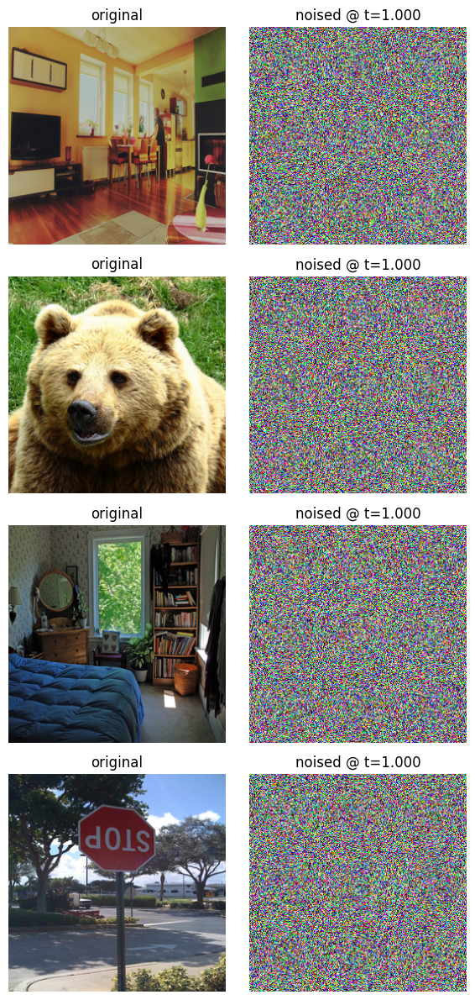

  ForwardProcess check Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00
  ForwardProcess check Not-Absolute values: Δxt=0.000e+00  Δeps=0.000e+00  Δσ=0.000e+00

Done.


In [ ]:
"""Run corruption and diagnostics
The code is identical to the one for the close perturbation with the following differences:
* In `sde.perturb_simulate_path( )` we now use a 1-D tensor to define the t_end where we stop the forward stochatic process
* We modified the `ForwardProcess` by setting final and closed_formula to False so that the simulated path get executed
"""
torch.manual_seed(cfg.seed)
for t_val in T_LIST:
    with torch.no_grad():
        t_vec = torch.full((x0.size(0),), float(t_val), device=x0.device, dtype=x0.dtype) # We build a length-B vector so that we can bradcast per sample

        # Path simulation (Euler–Maruyama)
        # Use a fixed generator so repeated runs are identical
        xt, eps_used, std_pred = sde.perturb_simulate_path(x_0=x0, t_end=float(t_val), steps=cfg.N, seed=cfg.seed)

        # Theoretical mean/std from the continuous-time marginal
        # Used only for diagnostics; simulated xt will deviate slightly at finite steps
        mean_t, std_again = sde.marginal_prob(x0, t_vec)
        # print(mean_t, std_again)

        # Reconstruct epsilon from xt and compare to returned eps
        eps_recon = (xt - mean_t) / (std_again[:, None, None, None] + 1e-12)
        recon_err = (eps_recon - eps_used).abs().max().item() # Max absolute difference should be ~ 0

        # Distribution sanity of epsilon
        eps_mean = eps_used.mean().item()
        eps_std  = eps_used.std().item()

        # Empirical std of (xt - mean_t) should match σ(t)
        empirical_std = (xt - mean_t).flatten(1).std(dim=1) # computed per-sample
        mae_sigma = torch.mean(torch.abs(empirical_std - std_again)).item() # MAE between empirical and predicted
        ratio_sigma = torch.mean(empirical_std / (std_again + 1e-12)).item() # Scale ratio should be ~ 1, because it capture bias of sigma(t)

        # Magnitude of corruption vs x0
        mse_x = F.mse_loss(xt, x0).item()

        print(f"[t={t_val:.3f}]  eps_mean={eps_mean:+.4f}  eps_std={eps_std:.4f}  "
              f"σ_pred(mean)={std_again.mean().item():.4f}  "
              f"|σ_emp-σ_pred|_MAE={mae_sigma:.4f}  σ_emp/σ_pred≈{ratio_sigma:.3f}  "
              f"recon_err(max)={recon_err:.2e}  MSE(xt,x0)={mse_x:.4f}")

        # Show a few examples
        show_examples(x0, xt, t_val, n=4, title_prefix="t")

# 6) Optional cross-check with ForwardProcess if available and callable
    if ForwardProcess is not None:
        try:
            # Build a matching sde_cfg container from cfg
            sde_cfg = ForwardProcess(beta_min=cfg.beta_min, beta_max=cfg.beta_max, N=cfg.N)
            # Try to call its API name if present
            got = getattr(ForwardProcess, "get_noised_latents", None)
            if callable(got):
                with torch.no_grad():
                    xt2, eps2, std2 = got(z0=x0,
                      t=float(t_val),
                      final=False,
                      eps=cfg.eps,
                      closed_formula=False,   # force simulated path
                      steps=cfg.N,
                      seed=cfg.seed,
                      sde_cfg=sde_cfg)

                #We are expecting a d_std that is close to 0, and a d_xt and d_eps which are >0, because of the independent sampling of epsilon
                d_xt = (xt2 - xt).abs().mean().item()
                d_eps = (eps2 - eps_used).abs().mean().item()
                d_std = (std2 - std_again).abs().mean().item()

                #We are expecting all metrics to be close to 0, since now we are taking in account sign difference
                d_xt_tot = (xt2 - xt).mean().item()
                d_eps_tot = (eps2 - eps_used).mean().item()
                d_std_tot = (std2 - std_again).mean().item()
                print(f"  ForwardProcess check Absolute values: Δxt={d_xt:.3e}  Δeps={d_eps:.3e}  Δσ={d_std:.3e}")
                print(f"  ForwardProcess check Not-Absolute values: Δxt={d_xt_tot:.3e}  Δeps={d_eps_tot:.3e}  Δσ={d_std_tot:.3e}")
            else:
                print("  ForwardProcess.get_noised_latents not found; skipped.")
        except Exception as e:
            print(f"  ForwardProcess cross-check failed: {type(e).__name__}: {e}")

print("\nDone.")